# Example usage notebook of the DD-GAN repo

### ------------------------------------------------------------------------------------------------



##### Code developed by Jon Tomasson
##### Contact: jon.tomasson1@gmail.com
##### https://github.com/acse-jat20/DD-GAN
##### 26.08.2021

In [1]:
import time
import numpy as np
import sklearn.preprocessing
import tensorflow as tf
import matplotlib.pyplot as plt
from copy import deepcopy

import matplotlib as mpl
import sys

After installation of the ddgan package run the following line to import it

In [2]:
sys.path.append("..")
import ddgan
from ddgan import *

In [3]:
# Plotting metadata
try:
    plt.style.use('science') 
    mpl.rcParams['figure.dpi'] = 300
except:
    pass

fonts1 = 15
fonts2 = 15
fonts3 = 12
plot_len = 12
plot_height = 8.5

# Number of POD coefficients plotted
show_dims = 5

### Loading Data

In [4]:
# Number of POD coefficients used
nPOD = 10

# Dimensionality of the latent space
nlatent = 100

# General information on the problem size
evaluated_subdomains = 2
subdomains = 4
dims = 3

# Number of neighbour and self time values. 
# Corresponds to n = n_b, n_a, n_self
added_dims = [1,1,3]

# Cumulative sum
cumulative_dims = [0,1,2]
steps = added_dims[-1]

# Cut away a bootup value where nothing happens
start_from = 1

# Total number of datapoints
datapoints = 1800 + steps + 50
step_size = 4
batch_size = 45

t_begin = 0
t_end = 1800

# Set to true to turn on debug mode
debug = False

# If training a new model
train = False

# If an old model is used
find_old_model = True

# Add noise to training?
noise = False

# Training epochs
epochs = 100 

# How regularly to perform gradient ascent
n_gradient_ascent = 1000

csv_data = np.load('../data/processed/DD/pod_coeffs_field_Velocity.npy', )

assert nPOD <= csv_data.shape[1], "Make sure the data includes enough POD coeffs"
assert datapoints + start_from <= csv_data.shape[2], "Not enough data"
assert evaluated_subdomains + 2 <= csv_data.shape[0], "Not enough domains"

In [5]:
# Cutting the dataset
print(csv_data.shape)
csv_data = csv_data[:subdomains,:nPOD,start_from:start_from+datapoints]
print(csv_data.shape)

(4, 10, 2000)
(4, 10, 1853)


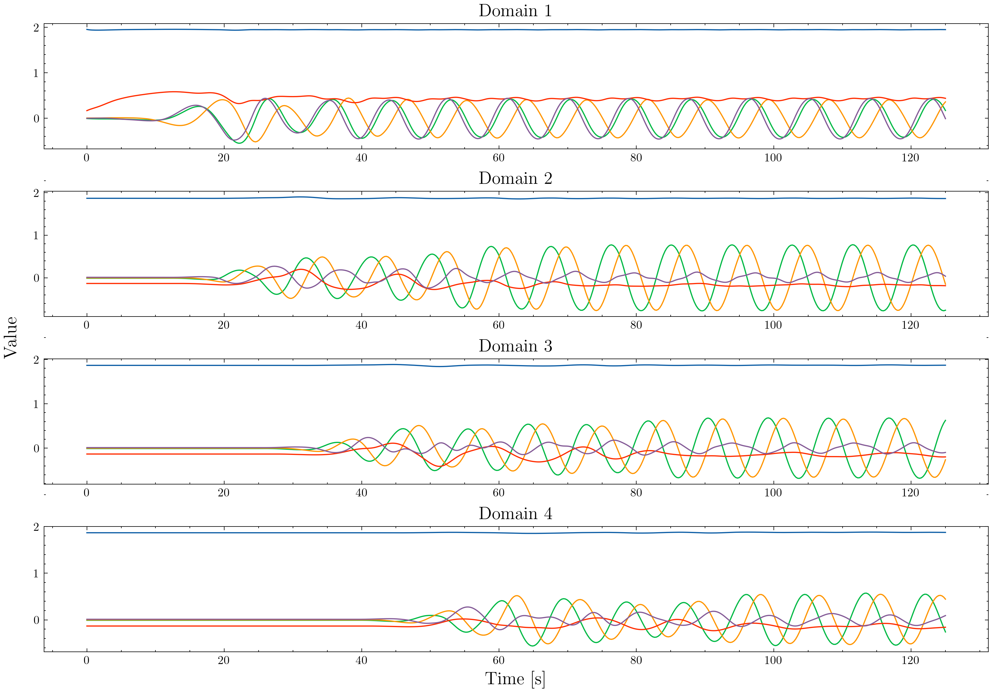

In [6]:
# Initialize figure
fig = plt.figure(figsize=(plot_len, plot_height))

# The big subplot
ax = fig.add_subplot(111)

# Turn off axis lines and ticks of the big subplot
ax.spines['top'].set_color('none')
ax.spines['bottom'].set_color('none')
ax.spines['left'].set_color('none')
ax.spines['right'].set_color('none')
ax.tick_params(labelcolor='w', top=False, bottom=False, left=False, right=False)


ax1 = fig.add_subplot(411)
ax1.set_title('Domain 1', fontsize=fonts1)
ax1.plot(np.linspace(0,125,500),csv_data[0,:5,:500].T)

ax1 = fig.add_subplot(412)
ax1.set_title('Domain 2', fontsize=fonts1)
ax1.plot(np.linspace(0,125,500),csv_data[1,:5,:500].T)

ax1 = fig.add_subplot(413)
ax1.set_title('Domain 3', fontsize=fonts1)
ax1.plot(np.linspace(0,125,500),csv_data[2,:5,:500].T)

ax1 = fig.add_subplot(414)
ax1.set_title('Domain 4', fontsize=fonts1)
ax1.plot(np.linspace(0,125,500),csv_data[3,:5,:500].T)
ax1.set_xlabel('Time [s]',fontsize=fonts2)
ax.set_ylabel('Value',fontsize=fonts2)
plt.tight_layout(pad=0.9, w_pad=2, h_pad=0.7)
plt.show()

In [7]:
# Transposing data
tmp_data = np.ones([subdomains, datapoints, nPOD])

# Making a dataset for debugging purposes
new_data = np.ones([subdomains, nPOD, datapoints])
for i in range(subdomains):
    for j in range(nPOD):
        for k in range(datapoints):
            new_data[i][j][k] = nPOD*j + (i + 1)*10000 + k  

for k in range(subdomains):
    tmp_data[k] = csv_data[k].T
    if debug:
        tmp_data[k] = new_data[k].T
    
csv_data = tmp_data
csv_data.shape

(4, 1853, 10)

In [8]:
# Scaling
scales = []
scaled_training = np.zeros_like(csv_data)
if debug is False:
    for i in range(subdomains):
        scales.append(sklearn.preprocessing.MinMaxScaler(feature_range=[-1,1]))
        scaled_training[i] = scales[i].fit_transform(csv_data[i])
if debug:
    scaled_training = csv_data

In [9]:
csv_data.shape

(4, 1853, 10)

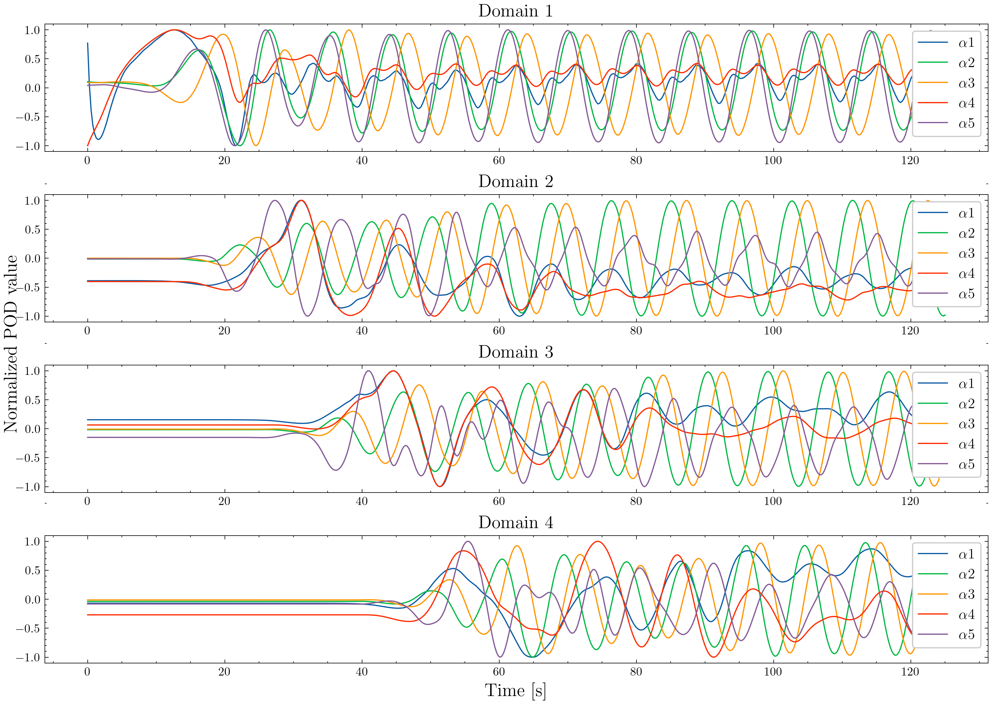

In [10]:
# Initialize figure
fig = plt.figure(figsize=(12, 8.5))
# The big subplot
ax = fig.add_subplot(111)

# Turn off axis lines and ticks of the big subplot
ax.spines['top'].set_color('none')
ax.spines['bottom'].set_color('none')
ax.spines['left'].set_color('none')
ax.spines['right'].set_color('none')
ax.tick_params(labelcolor='w', top=False, bottom=False, left=False, right=False)


ax1 = fig.add_subplot(411)
ax1.set_title('Domain 1', fontsize=fonts1)
for i in range(5):
    ax1.plot(np.linspace(0,125,500),scaled_training[0,:500,i].T, label = r'$\alpha$' + str(i+1))
ax1.legend(loc='upper right', frameon=True, framealpha=1, fontsize=fonts3)

ax1 = fig.add_subplot(412)
ax1.set_title('Domain 2', fontsize=fonts1)
for i in range(5):
    ax1.plot(np.linspace(0,125,500),scaled_training[1,:500,i].T, label = r'$\alpha$' + str(i+1))
ax1.legend(loc='upper right', frameon=True, framealpha=1, fontsize=fonts3)

ax1 = fig.add_subplot(413)
ax1.set_title('Domain 3', fontsize=fonts1)
for i in range(5):
    ax1.plot(np.linspace(0,125,500),scaled_training[2,:500,i].T, label = r'$\alpha$' + str(i+1))
ax1.legend(loc='upper right', frameon=True, framealpha=1, fontsize=fonts3)

ax1 = fig.add_subplot(414)
ax1.set_title('Domain 4',fontsize=fonts1)
for i in range(5):
    ax1.plot(np.linspace(0,125,500),scaled_training[3,:500,i].T, label = r'$\alpha$' + str(i+1))
ax1.legend(loc='upper right', frameon=True, framealpha=1, fontsize=fonts3)

ax1.set_xlabel('Time [s]',fontsize=fonts1)
ax.set_ylabel('Normalized POD value',fontsize=fonts1)
plt.tight_layout(pad=0.9, w_pad=2, h_pad=0.7)
plt.show()

In [11]:
# Asserting scaling is accurate
if debug is False:
    cond = np.zeros_like(scaled_training)
    for i in range(subdomains):
        cond[i] = scales[i].inverse_transform(scaled_training[i])
    assert np.allclose(csv_data[0,:,0], cond[0,:,0]), "Scaling failed"  

    for dim in range(subdomains):
        for icol in range(nPOD):
            assert np.isclose(np.min(scaled_training[dim][:,icol]) + np.max(scaled_training[dim][:,icol]), 0), "Scaling failed" 

### Decomposing the data and ordering the samples

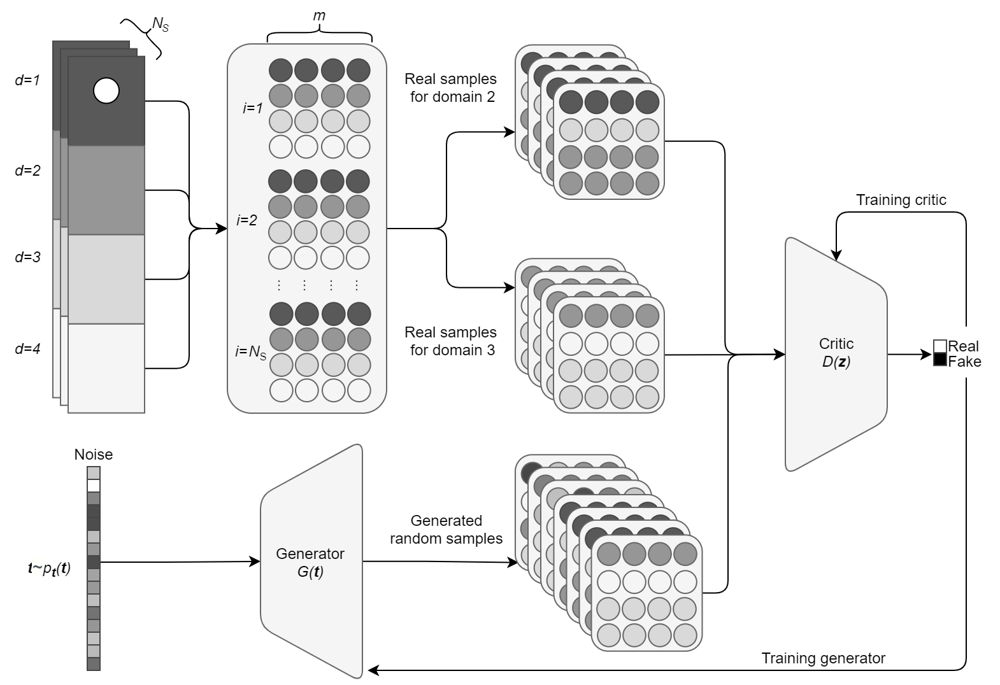

In [12]:
# Setting up the data into subdomains 
# 2 x nTrain x nsteps * nPOD *3 # 'float32' or np.float32

assert sum(added_dims[:-1]) == cumulative_dims[-1], 'Check added_dims'

training_data = np.zeros((evaluated_subdomains, t_end, np.sum(added_dims * nPOD)), dtype=np.float32) 

# See image above on how the data is structured
for domain in range(evaluated_subdomains): 
    for i, dim in enumerate([0,2,1]):
        for j, step in enumerate(range(steps-added_dims[i], steps)):
            training_data[domain, :, cumulative_dims[i]*nPOD + j*nPOD : cumulative_dims[i]*nPOD + (j+1)*nPOD] = scaled_training[dim + domain][t_begin+(step*step_size) : t_end+(step*step_size), :]

# Adding data for leftmost and rightmost domain
boundrary_conditions = []
boundrary_conditions.append(scaled_training[0, (steps-1)*step_size:])
boundrary_conditions.append(scaled_training[-1, (steps-1)*step_size:])
assert np.allclose(training_data[0,1,(added_dims[0]-1)*nPOD:added_dims[0]*nPOD], boundrary_conditions[0][1]), 'Check the boundrary condition data.'

joined_train_data = training_data.reshape((training_data.shape[1]*training_data.shape[0], training_data.shape[2]))

### Initializing GAN

In [13]:
kwargs = {
    "nsteps" : np.sum(added_dims),
    "ndims" : nPOD,
    "nLatent": nlatent,
    "batch_size" : batch_size,
    "batches" : int(len(joined_train_data)/batch_size),
    "seed" : 143,
    "epochs" : epochs,
    "noise" : noise,
    "n_gradient_ascent" : n_gradient_ascent,
    "logs_location" : './logs/gradient_tape/224/',
    "model_location" : 'models/224/'
}

gan = GAN(**kwargs)
gan.setup(find_old_model=find_old_model)
set_seed(gan.seed)

ndims_latent_input = gan.ndims
joined_train_data = np.float32(joined_train_data)
print('type and shape (nPOD by nTrain) of POD coeffs from csv file', type(joined_train_data), joined_train_data.shape, joined_train_data.dtype)

looking for previous saved models
type and shape (nPOD by nTrain) of POD coeffs from csv file <class 'numpy.ndarray'> (3600, 50) float32


### Making a histogram 

In [14]:
kwargs = {
    "nsteps" : np.sum(added_dims),
    "ndims" : nPOD,
    "nLatent": nlatent,
    "batch_size" : batch_size,
    "batches" : int(len(joined_train_data)/batch_size),
    "seed" : 143,
    "epochs" : epochs,
    "noise" : noise,
    "n_gradient_ascent" : n_gradient_ascent,
    "logs_location" : './logs/gradient_tape/224/',
    "model_location" : 'models/224/'
}

gan2 = GAN(**kwargs)
gan2.setup(find_old_model=True)
set_seed(gan.seed)

ndims_latent_input = gan.ndims
joined_train_data = np.float32(joined_train_data)
print('type and shape (nPOD by nTrain) of POD coeffs from csv file', type(joined_train_data), joined_train_data.shape, joined_train_data.dtype)

looking for previous saved models
type and shape (nPOD by nTrain) of POD coeffs from csv file <class 'numpy.ndarray'> (3600, 50) float32


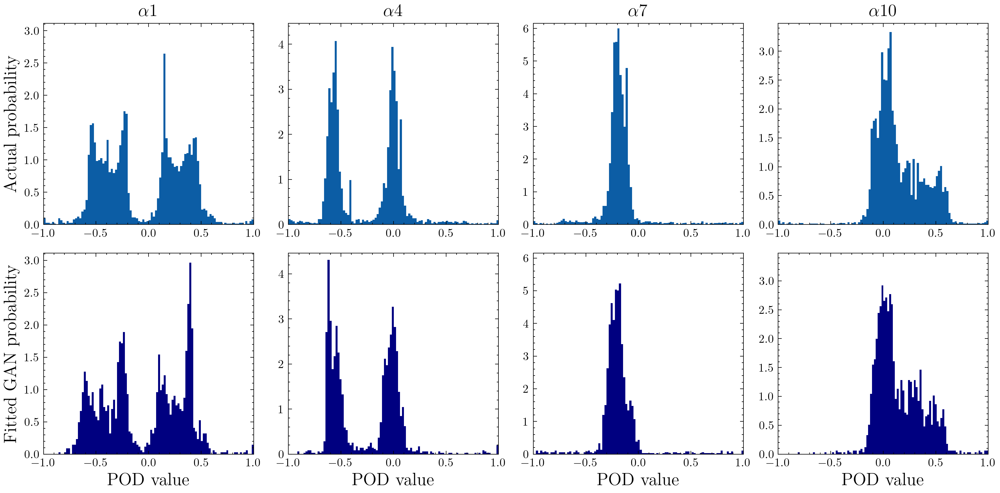

In [15]:
fig = plt.figure(figsize=(plot_len, 6))
sidestep = 0
multiplier = 3
samples = 4

n_bins = 100
pod_dim = 3

for i in range(1,1 + samples):
    pod_dim = (i-1)* multiplier + sidestep
    
    # Actual data
    x1 = np.ravel(scaled_training[1:3,:,pod_dim])
    # Gan prediction
    x2 = gan2.generator(np.random.normal(0,1,[1853,100]))[:,30 + pod_dim].numpy()

    # Plotting actual data
    ax1 = fig.add_subplot(200 + samples *10 + i)
    ax1.set_title(r'$\alpha$' + str(pod_dim + 1), fontsize=fonts1)
    ax1.set_xlim([-1,1])
    n1, _, _ = ax1.hist(x1, n_bins, density=True)
    
    # Collecting values for plt 2 for scaling of y axis
    n2, bins, patches = ax1.hist(x2, n_bins, alpha=0, density=True)
    ylim = np.max([n1,n2]) + 0.15
    ax1.set_ylim([0,ylim])
    
    if i ==1:
        ax1.set_ylabel('Actual probability', fontsize=fonts1)

    # PLotting prediction
    ax1 = fig.add_subplot(200 + samples * 10 + i + samples)
    n, bins, patches = ax1.hist(x2, n_bins, color = ['Navy'], density=True)
    ax1.set_xlabel('POD value',fontsize=fonts1)
    ax1.set_xlim([-1,1])
    ax1.set_ylim([0,ylim])
    if i ==1:
        ax1.set_ylabel('Fitted GAN probability', fontsize=fonts1)


plt.tight_layout(pad=0.9, w_pad=0.7, h_pad=1.2)
plt.show()

### Getting back to training 

In [16]:
if train:
    # Load the TensorBoard notebook extension
    %load_ext tensorboard
    %tensorboard --logdir ./logs/gradient_tape/ --port 6008
    %reload_ext tensorboard

In [17]:
if train:
    gan.learn_hypersurface_from_POD_coeffs(joined_train_data)

### Starting a training/predicting loop

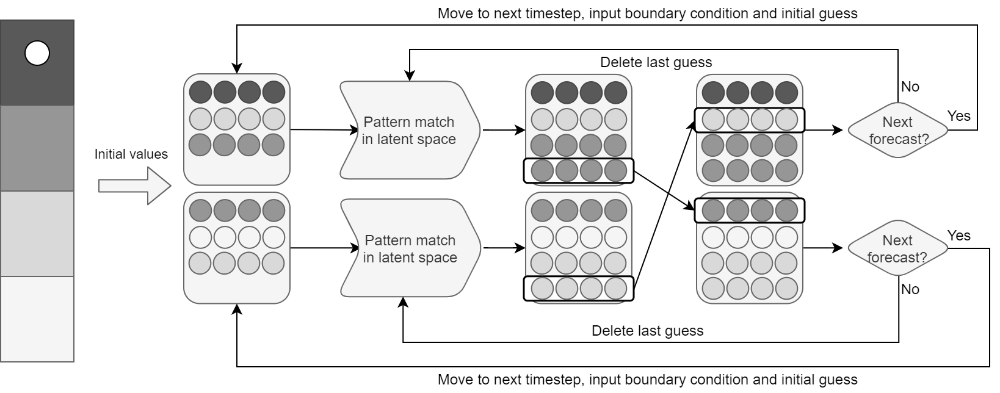

In [18]:
# Just watching the training of the GAN if Train=True
if train:
    for i in range(24):
        kwargs_opt = {
            "start_from" : 700,
            "nPOD" : nPOD,
            "nLatent" : 100,
            "npredictions" : 10,
            "optimizer_epochs" : 50,
            "dt" : step_size,
            "gan" : gan,
            "cycles" : 10,
            "debug" : debug,
            "disturb" : True
        }

        optimizer = Optimize(**kwargs_opt)
        fld = optimizer.predictDD(training_data,
                                   tf.convert_to_tensor(np.array(boundrary_conditions, dtype=np.float32)),
                                   dim_steps=added_dims)
        
        # Plotting on the current predictive abilities
        show_dims = 5
        fig = plt.figure(figsize=(20, 12))

        ax1 = fig.add_subplot(321)
        ax1.plot(scaled_training[1,optimizer.start_from:optimizer.start_from + (added_dims[-1]-1+optimizer.npredictions) * step_size: step_size,:show_dims])
        ax1 = fig.add_subplot(323)
        ax1.plot(fld[0, :, :show_dims])
        ax1 = fig.add_subplot(325)
        ax1.plot(np.abs(scaled_training[1,optimizer.start_from:optimizer.start_from + (added_dims[-1]-1+optimizer.npredictions) * step_size: step_size, :show_dims] - fld[0,:, :show_dims]))


        ax1 = fig.add_subplot(322)
        ax1.plot(scaled_training[2,optimizer.start_from:optimizer.start_from + (added_dims[-1]-1+optimizer.npredictions) * step_size: step_size, :show_dims])
        ax1 = fig.add_subplot(324)
        ax1.plot(fld[1, :, :show_dims])
        ax1 = fig.add_subplot(326)
        ax1.plot(np.abs(scaled_training[2,optimizer.start_from:optimizer.start_from + (added_dims[-1]-1+optimizer.npredictions) * step_size: step_size, :show_dims] - fld[1, :, :show_dims]))

        plt.show()

        gan.resume_training(joined_train_data, 0)

### Predicting

Here dt = 4 but we want an increased prediction fidelity so 2 prediction loops are set up 2 timesteps apart

Time step: 	 0
Cycle: 	 0
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 1
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 2
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 3
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 4
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 5
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 6
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 7
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 8
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 9
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 10
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 11
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 12
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Op

Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 5
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 6
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 7
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 8
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 9
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 10
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 11
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 12
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 13
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 14
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 15
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 16
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 17
Domain: 	 0
Optimizer ep

Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 8
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 9
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 10
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 11
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 12
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 13
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 14
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 15
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 16
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 17
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 18
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 19
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Domain: 	 0
Optimizer epoch: 	 0


Cycle: 	 12
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 13
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 14
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 15
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 16
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 17
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 18
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 19
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Domain: 	 0
Optimizer epoch: 	 0
Time step: 	 16
Cycle: 	 0
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 1
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 2
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 3
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 4
Domain: 

Cycle: 	 16
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 17
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 18
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 19
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Domain: 	 0
Optimizer epoch: 	 0
Time step: 	 21
Cycle: 	 0
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 1
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 2
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 3
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 4
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 5
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 6
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 7
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 8
Domain: 	 0


Domain: 	 0
Optimizer epoch: 	 0
Time step: 	 26
Cycle: 	 0
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 1
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 2
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 3
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 4
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 5
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 6
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 7
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 8
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 9
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 10
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 11
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 12
Domain: 	 0
O

Cycle: 	 3
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 4
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 5
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 6
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 7
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 8
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 9
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 10
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 11
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 12
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 13
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 14
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 15
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoc

Cycle: 	 7
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 8
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 9
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 10
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 11
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 12
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 13
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 14
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 15
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 16
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 17
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 18
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 19
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer 

Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 10
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 11
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 12
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 13
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 14
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 15
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 16
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 17
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 18
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 19
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Domain: 	 0
Optimizer epoch: 	 0
Time step: 	 42
Cycle: 	 0
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 1
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optim

Cycle: 	 13
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 14
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 15
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 16
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 17
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 18
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 19
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Domain: 	 0
Optimizer epoch: 	 0
Time step: 	 47
Cycle: 	 0
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 1
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 2
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 3
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 4
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 5
Domain: 	

Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 16
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 17
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 18
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 19
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Domain: 	 0
Optimizer epoch: 	 0
Time step: 	 52
Cycle: 	 0
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 1
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 2
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 3
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 4
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 5
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 6
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 7
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer e

Cycle: 	 19
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Domain: 	 0
Optimizer epoch: 	 0
Time step: 	 57
Cycle: 	 0
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 1
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 2
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 3
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 4
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 5
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 6
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 7
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 8
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 9
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 10
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 11
Domain: 	 0
O

Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 2
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 3
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 4
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 5
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 6
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 7
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 8
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 9
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 10
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 11
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 12
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 13
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 14
Domain: 	 0
Optimizer epoch

Cycle: 	 5
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 6
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 7
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 8
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 9
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 10
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 11
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 12
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 13
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 14
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 15
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 16
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 17
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer ep

Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 8
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 9
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 10
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 11
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 12
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 13
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 14
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 15
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 16
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 17
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 18
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 19
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Domain: 	 0
Optimizer epoch: 	 0


Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 12
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 13
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 14
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 15
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 16
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 17
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 18
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 19
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Domain: 	 0
Optimizer epoch: 	 0
Time step: 	 78
Cycle: 	 0
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 1
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 2
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 3
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimiz

Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 16
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 17
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 18
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 19
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Domain: 	 0
Optimizer epoch: 	 0
Time step: 	 83
Cycle: 	 0
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 1
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 2
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 3
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 4
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 5
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 6
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 7
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer e

Cycle: 	 19
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Domain: 	 0
Optimizer epoch: 	 0
Time step: 	 88
Cycle: 	 0
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 1
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 2
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 3
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 4
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 5
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 6
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 7
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 8
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 9
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 10
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 11
Domain: 	 0
O

Cycle: 	 3
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 4
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 5
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 6
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 7
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 8
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 9
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 10
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 11
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 12
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 13
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 14
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 15
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoc

Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 7
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 8
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 9
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 10
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 11
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 12
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 13
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 14
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 15
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 16
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 17
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 18
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 19
D

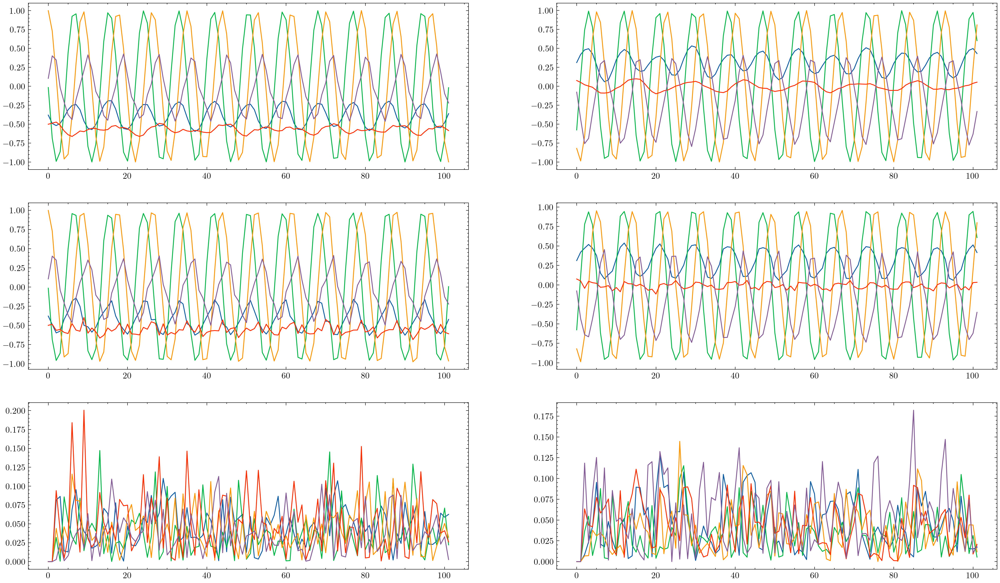

In [19]:
# Making one final prediction
kwargs_opt = {
    "start_from" : 700,
    "nPOD" : nPOD,
    "nLatent" : 100,
    "npredictions" : 100,
    "optimizer_epochs" : 50,
    "dt" : step_size,
    "gan" : gan,
    "cycles" : 20,
    "debug" : debug,
    "disturb" : True
}

optimizer = Optimize(**kwargs_opt)
fld = optimizer.predictDD(training_data,
                           tf.convert_to_tensor(np.array(boundrary_conditions, dtype=np.float32)),
                           dim_steps=added_dims)

show_dims = 5
fig = plt.figure(figsize=(20, 12))

ax1 = fig.add_subplot(321)
ax1.plot(scaled_training[1,optimizer.start_from:optimizer.start_from + (added_dims[-1]-1+optimizer.npredictions) * step_size: step_size,:show_dims])
ax1 = fig.add_subplot(323)
ax1.plot(fld[0, :, :show_dims])
ax1 = fig.add_subplot(325)
ax1.plot(np.abs(scaled_training[1,optimizer.start_from:optimizer.start_from + (added_dims[-1]-1+optimizer.npredictions) * step_size: step_size, :show_dims] - fld[0,:, :show_dims]))


ax1 = fig.add_subplot(322)
ax1.plot(scaled_training[2,optimizer.start_from:optimizer.start_from + (added_dims[-1]-1+optimizer.npredictions) * step_size: step_size, :show_dims])
ax1 = fig.add_subplot(324)
ax1.plot(fld[1, :, :show_dims])
ax1 = fig.add_subplot(326)
ax1.plot(np.abs(scaled_training[2,optimizer.start_from:optimizer.start_from + (added_dims[-1]-1+optimizer.npredictions) * step_size: step_size, :show_dims] - fld[1, :, :show_dims]))

plt.show()

Time step: 	 0
Cycle: 	 0
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 1
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 2
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 3
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 4
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 5
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 6
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 7
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 8
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 9
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 10
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 11
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 12
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Op

Cycle: 	 4
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 5
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 6
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 7
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 8
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 9
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 10
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 11
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 12
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 13
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 14
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 15
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 16
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epo

Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 9
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 10
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 11
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 12
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 13
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 14
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 15
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 16
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 17
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 18
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 19
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Domain: 	 0
Optimizer epoch: 	 0
Time step: 	 11
Cycle: 	 0
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optim

Cycle: 	 12
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 13
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 14
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 15
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 16
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 17
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 18
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 19
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Domain: 	 0
Optimizer epoch: 	 0
Time step: 	 16
Cycle: 	 0
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 1
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 2
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 3
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 4
Domain: 

Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 15
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 16
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 17
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 18
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 19
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Domain: 	 0
Optimizer epoch: 	 0
Time step: 	 21
Cycle: 	 0
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 1
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 2
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 3
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 4
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 5
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 6
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer 

Domain: 	 1
Optimizer epoch: 	 0
Domain: 	 0
Optimizer epoch: 	 0
Time step: 	 26
Cycle: 	 0
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 1
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 2
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 3
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 4
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 5
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 6
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 7
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 8
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 9
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 10
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 11
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epo

Cycle: 	 2
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 3
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 4
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 5
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 6
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 7
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 8
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 9
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 10
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 11
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 12
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 13
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 14
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch

Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 6
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 7
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 8
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 9
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 10
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 11
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 12
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 13
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 14
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 15
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 16
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 17
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 18
Domain: 	 0
Optimizer e

Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 10
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 11
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 12
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 13
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 14
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 15
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 16
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 17
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 18
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 19
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Domain: 	 0
Optimizer epoch: 	 0
Time step: 	 42
Cycle: 	 0
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 1
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optim

Cycle: 	 13
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 14
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 15
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 16
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 17
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 18
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 19
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Domain: 	 0
Optimizer epoch: 	 0
Time step: 	 47
Cycle: 	 0
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 1
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 2
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 3
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 4
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 5
Domain: 	

Cycle: 	 17
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 18
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 19
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Domain: 	 0
Optimizer epoch: 	 0
Time step: 	 52
Cycle: 	 0
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 1
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 2
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 3
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 4
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 5
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 6
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 7
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 8
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 9
Domain: 	 0
O

Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 1
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 2
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 3
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 4
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 5
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 6
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 7
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 8
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 9
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 10
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 11
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 12
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 13
Domain: 	 0
Optimizer epoch:

Optimizer epoch: 	 0
Cycle: 	 4
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 5
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 6
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 7
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 8
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 9
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 10
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 11
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 12
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 13
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 14
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 15
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 16
Domain: 	 0
Optimizer epoch: 	 0
Doma

Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 7
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 8
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 9
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 10
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 11
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 12
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 13
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 14
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 15
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 16
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 17
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 18
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 19
Domain: 	 0
Optimizer 

Cycle: 	 10
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 11
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 12
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 13
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 14
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 15
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 16
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 17
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 18
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 19
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Domain: 	 0
Optimizer epoch: 	 0
Time step: 	 73
Cycle: 	 0
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 1
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 2
Domain

Cycle: 	 13
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 14
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 15
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 16
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 17
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 18
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 19
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Domain: 	 0
Optimizer epoch: 	 0
Time step: 	 78
Cycle: 	 0
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 1
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 2
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 3
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 4
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 5
Domain: 	

Cycle: 	 16
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 17
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 18
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 19
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Domain: 	 0
Optimizer epoch: 	 0
Time step: 	 83
Cycle: 	 0
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 1
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 2
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 3
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 4
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 5
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 6
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 7
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 8
Domain: 	 0


Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 19
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Domain: 	 0
Optimizer epoch: 	 0
Time step: 	 88
Cycle: 	 0
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 1
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 2
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 3
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 4
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 5
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 6
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 7
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 8
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 9
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 10
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epo

Cycle: 	 2
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 3
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 4
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 5
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 6
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 7
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 8
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 9
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 10
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 11
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 12
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 13
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 14
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch

Cycle: 	 5
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 6
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 7
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 8
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 9
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 10
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 11
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 12
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 13
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 14
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 15
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 16
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 17
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer ep

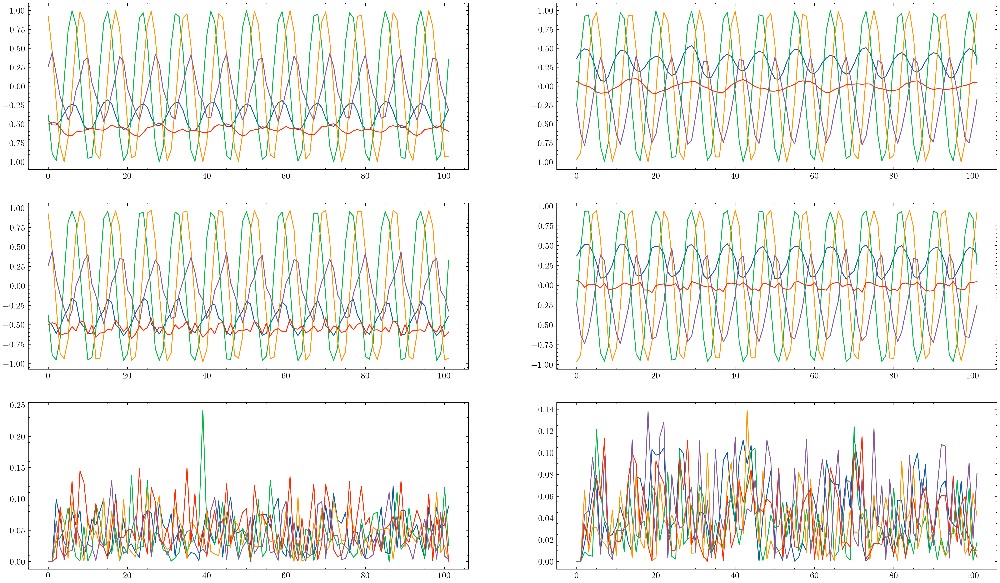

In [20]:
# Making the second prediction loop
kwargs_opt = {
    "start_from" : 702,
    "nPOD" : nPOD,
    "nLatent" : 100,
    "npredictions" : 100,
    "optimizer_epochs" : 50,
    "dt" : step_size,
    "gan" : gan,
    "cycles" : 20,
    "debug" : debug,
    "disturb" : True
}

optimizer = Optimize(**kwargs_opt)
fld1 = optimizer.predictDD(training_data,
                           tf.convert_to_tensor(np.array(boundrary_conditions, dtype=np.float32)),
                           dim_steps=added_dims)

show_dims = 5
fig = plt.figure(figsize=(20, 12))

ax1 = fig.add_subplot(321)
ax1.plot(scaled_training[1,optimizer.start_from:optimizer.start_from + (added_dims[-1]-1+optimizer.npredictions) * step_size: step_size,:show_dims])
ax1 = fig.add_subplot(323)
ax1.plot(fld1[0, :, :show_dims])
ax1 = fig.add_subplot(325)
ax1.plot(np.abs(scaled_training[1,optimizer.start_from:optimizer.start_from + (added_dims[-1]-1+optimizer.npredictions) * step_size: step_size, :show_dims] - fld1[0,:, :show_dims]))


ax1 = fig.add_subplot(322)
ax1.plot(scaled_training[2,optimizer.start_from:optimizer.start_from + (added_dims[-1]-1+optimizer.npredictions) * step_size: step_size, :show_dims])
ax1 = fig.add_subplot(324)
ax1.plot(fld1[1, :, :show_dims])
ax1 = fig.add_subplot(326)
ax1.plot(np.abs(scaled_training[2,optimizer.start_from:optimizer.start_from + (added_dims[-1]-1+optimizer.npredictions) * step_size: step_size, :show_dims] - fld1[1, :, :show_dims]))

plt.show()

Now merging the data

In [21]:
a=np.reshape(np.ravel([fld[0],fld1[0]], "F"),[10,-1]).T
b=np.reshape(np.ravel([fld[1],fld1[1]], "F"),[10,-1]).T

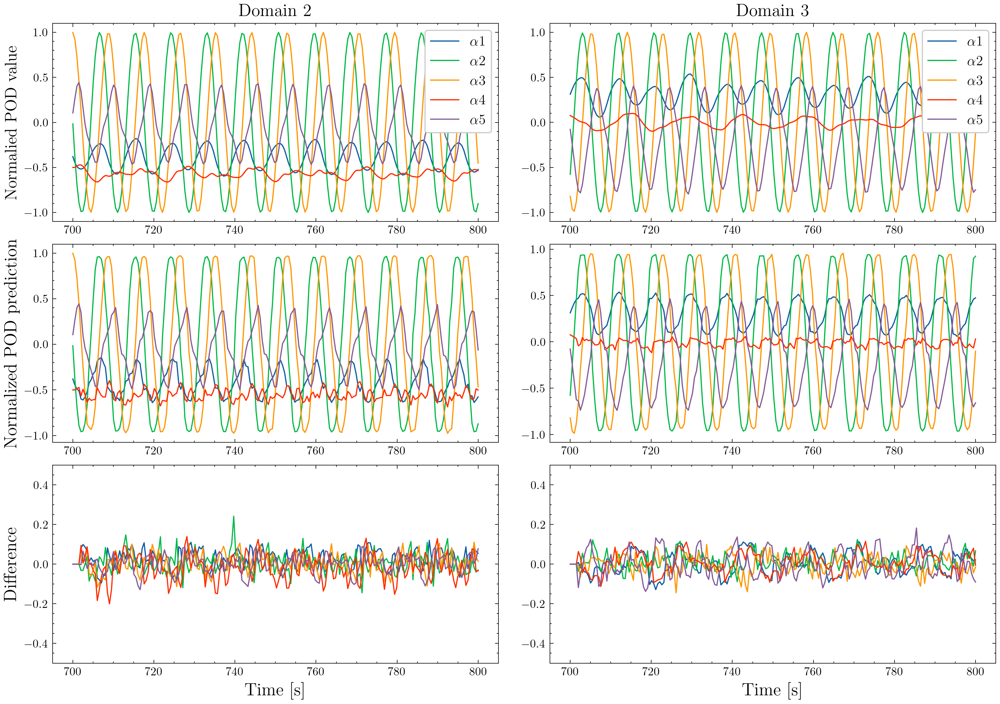

In [22]:
# Just a plotting sequence for getting actual values and comparing them to predictions 

start = 700
xaxis = np.linspace(start, start+100, 200)

fig = plt.figure(figsize=(plot_len, plot_height))

ax1 = fig.add_subplot(321)
ax1.set_title('Domain 2',fontsize=fonts1)
for i in range(show_dims):
    ax1.plot(xaxis, scaled_training[1, start:start + 100*4:2][:,i], label = r'$\alpha$' + str(i+1))
ax1.set_ylabel('Normalied POD value', fontsize=14)
ax1.legend(loc='upper right', frameon=True, framealpha=1, fontsize=fonts3)

ax1 = fig.add_subplot(323)
ax1.plot(xaxis, a[:200,:show_dims])
ax1.set_ylabel('Normalized POD prediction',fontsize=fonts2)
ax1 = fig.add_subplot(325)
ax1.plot(xaxis, scaled_training[1, start:start + 100*4:2][:,:show_dims]- a[:200,:show_dims])
ax1.set_ylabel('Difference', fontsize=fonts2)
ax1.set_xlabel('Time [s]', fontsize=fonts2)
ax1.set_ylim([-0.5,0.5])

ax1 = fig.add_subplot(322)
ax1.set_title('Domain 3',fontsize=fonts1)
for i in range(show_dims):
    ax1.plot(xaxis, scaled_training[2, start:start + 100*4:2][:,i], label = r'$\alpha$' + str(i+1))
ax1.legend(loc='upper right', frameon=True, framealpha=1, fontsize=fonts3)
ax1 = fig.add_subplot(324)
ax1.plot(xaxis, b[:200,:show_dims])
ax1 = fig.add_subplot(326)
ax1.plot(xaxis, scaled_training[2, start:start + 100*4:2][:,:show_dims]- b[:200,:show_dims])
ax1.set_xlabel('Time [s]', fontsize=fonts2)
ax1.set_ylim([-0.5,0.5])

plt.tight_layout(pad=0.9, w_pad=2, h_pad=0.7)
plt.show()

De-normalizing and plotting

In [23]:
a1 = scales[1].inverse_transform(a)
b1 = scales[2].inverse_transform(b)

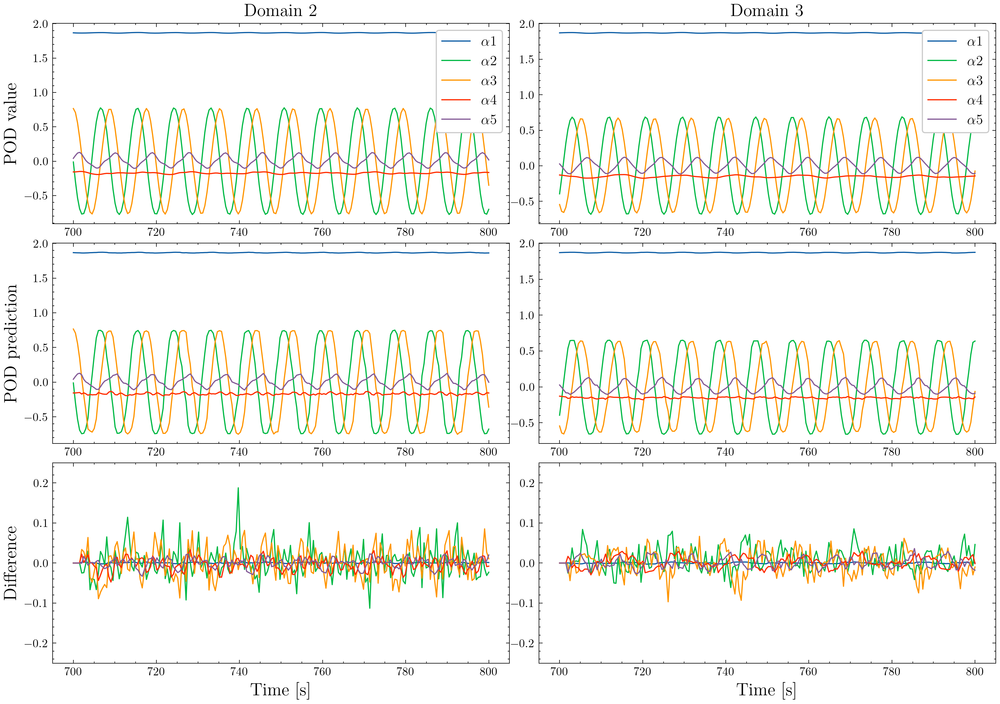

In [24]:
# Another plotting sequence, this time comparing the rescaled values

fig = plt.figure(figsize=(plot_len, plot_height))

ax1 = fig.add_subplot(321)
ax1.set_title('Domain 2',fontsize=fonts1)
for i in range(show_dims):
    ax1.plot(xaxis, scales[1].inverse_transform(scaled_training[1, start:start + 100*4:2])[:,i], label = r'$\alpha$' + str(i+1))
ax1.set_ylabel('POD value',fontsize=fonts2)
ax1.legend(loc='upper right', frameon=True, framealpha=1, fontsize=fonts3)

ax1 = fig.add_subplot(323)
ax1.plot(xaxis, a1[:200,:show_dims])
ax1.set_ylabel('POD prediction',fontsize=fonts2)
ax1 = fig.add_subplot(325)
ax1.plot(xaxis, scales[1].inverse_transform(scaled_training[1, start:start + 100*4:2])[:,:show_dims]- a1[:200,:show_dims])
ax1.set_ylabel('Difference',fontsize=fonts2)
ax1.set_xlabel('Time [s]',fontsize=fonts2)
ax1.set_ylim([-0.25,0.25])

ax1 = fig.add_subplot(322)
ax1.set_title('Domain 3',fontsize=fonts1)
for i in range(show_dims):
    ax1.plot(xaxis, scales[2].inverse_transform(scaled_training[2, start:start + 100*4:2])[:,i], label = r'$\alpha$' + str(i+1))
ax1.legend(loc='upper right', frameon=True, framealpha=1, fontsize=fonts3)
ax1 = fig.add_subplot(324)
ax1.plot(xaxis, b1[:200,:show_dims])
ax1 = fig.add_subplot(326)
ax1.plot(xaxis, scales[2].inverse_transform(scaled_training[2, start:start + 100*4:2])[:,:show_dims]- b1[:200,:show_dims])
ax1.set_xlabel('Time [s]',fontsize=fonts2)
ax1.set_ylim([-0.25,0.25])

plt.tight_layout(pad=0.9, w_pad=0.1, h_pad=0.1)
plt.show()

### Collecting numerical results

In [25]:
error1 = []
error2 = []
start = []
show_dims = 10
for i in range(20):
    kwargs_opt = {
        "start_from" : np.random.randint(0, 1700),
        "nPOD" : nPOD,
        "nLatent" : 100,
        "npredictions" : 50,
        "optimizer_epochs" : 50,
        "dt" : step_size,
        "gan" : gan,
        "cycles" : 20,
        "debug" : debug,
        "disturb" : True
    }

    optimizer = Optimize(**kwargs_opt)
    fld2 = optimizer.predictDD(training_data,
                               tf.convert_to_tensor(np.array(boundrary_conditions, dtype=np.float32)),
                               dim_steps=added_dims)

    start.append(optimizer.start_from)
    error1.append(np.sqrt(np.sum((scales[1].inverse_transform(scaled_training[1,optimizer.start_from:optimizer.start_from + (added_dims[-1]-1+optimizer.npredictions) * step_size: step_size, :show_dims]) - scales[1].inverse_transform(fld2[0, :, :show_dims]))**2)/(show_dims *52)))
                  
    error2.append(np.sqrt(np.sum((scales[2].inverse_transform(scaled_training[2,optimizer.start_from:optimizer.start_from + (added_dims[-1]-1+optimizer.npredictions) * step_size: step_size, :show_dims]) - scales[2].inverse_transform(fld2[1, :, :show_dims]))**2)/(show_dims *52)))


Time step: 	 0
Cycle: 	 0
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 1
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 2
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 3
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 4
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 5
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 6
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 7
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 8
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 9
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 10
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 11
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 12
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Op

Cycle: 	 3
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 4
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 5
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 6
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 7
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 8
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 9
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 10
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 11
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 12
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 13
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 14
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 15
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoc

Cycle: 	 7
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 8
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 9
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 10
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 11
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 12
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 13
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 14
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 15
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 16
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 17
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 18
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 19
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer 

Cycle: 	 11
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 12
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 13
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 14
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 15
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 16
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 17
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 18
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 19
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Domain: 	 0
Optimizer epoch: 	 0
Time step: 	 16
Cycle: 	 0
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 1
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 2
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 3
Domain:

Cycle: 	 14
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 15
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 16
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 17
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 18
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 19
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Domain: 	 0
Optimizer epoch: 	 0
Time step: 	 21
Cycle: 	 0
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 1
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 2
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 3
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 4
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 5
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 6
Domain: 	 

Cycle: 	 18
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 19
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Domain: 	 0
Optimizer epoch: 	 0
Time step: 	 26
Cycle: 	 0
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 1
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 2
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 3
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 4
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 5
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 6
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 7
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 8
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 9
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 10
Domain: 	 0
O

Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 1
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 2
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 3
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 4
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 5
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 6
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 7
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 8
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 9
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 10
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 11
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 12
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 13
Domain: 	 0
Optimizer epoch:

Cycle: 	 5
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 6
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 7
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 8
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 9
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 10
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 11
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 12
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 13
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 14
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 15
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 16
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 17
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer ep

Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 10
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 11
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 12
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 13
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 14
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 15
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 16
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 17
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 18
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 19
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Domain: 	 0
Optimizer epoch: 	 0
Time step: 	 42
Cycle: 	 0
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 1
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optim

Cycle: 	 13
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 14
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 15
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 16
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 17
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 18
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 19
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Domain: 	 0
Optimizer epoch: 	 0
Time step: 	 47
Cycle: 	 0
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 1
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 2
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 3
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 4
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 5
Domain: 	

Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 16
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 17
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 18
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 19
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Domain: 	 0
Optimizer epoch: 	 0
Time step: 	 2
Cycle: 	 0
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 1
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 2
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 3
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 4
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 5
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 6
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 7
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer ep

Domain: 	 1
Optimizer epoch: 	 0
Domain: 	 0
Optimizer epoch: 	 0
Time step: 	 7
Cycle: 	 0
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 1
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 2
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 3
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 4
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 5
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 6
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 7
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 8
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 9
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 10
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 11
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoc

Cycle: 	 3
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 4
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 5
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 6
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 7
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 8
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 9
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 10
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 11
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 12
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 13
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 14
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 15
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoc

Cycle: 	 6
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 7
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 8
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 9
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 10
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 11
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 12
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 13
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 14
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 15
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 16
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 17
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 18
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer e

Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 9
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 10
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 11
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 12
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 13
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 14
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 15
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 16
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 17
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 18
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 19
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Domain: 	 0
Optimizer epoch: 	 0
Time step: 	 23
Cycle: 	 0
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optim

Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 12
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 13
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 14
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 15
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 16
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 17
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 18
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 19
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Domain: 	 0
Optimizer epoch: 	 0
Time step: 	 28
Cycle: 	 0
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 1
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 2
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 3
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimiz

Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 15
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 16
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 17
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 18
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 19
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Domain: 	 0
Optimizer epoch: 	 0
Time step: 	 33
Cycle: 	 0
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 1
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 2
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 3
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 4
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 5
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 6
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer 

Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 19
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Domain: 	 0
Optimizer epoch: 	 0
Time step: 	 38
Cycle: 	 0
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 1
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 2
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 3
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 4
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 5
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 6
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 7
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 8
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 9
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 10
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epo

Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 1
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 2
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 3
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 4
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 5
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 6
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 7
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 8
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 9
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 10
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 11
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 12
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 13
Domain: 	 0
Optimizer epoch:

Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 5
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 6
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 7
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 8
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 9
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 10
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 11
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 12
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 13
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 14
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 15
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 16
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 17
Domain: 	 0
Optimizer ep

Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 9
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 10
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 11
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 12
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 13
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 14
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 15
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 16
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 17
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 18
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 19
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Domain: 	 0
Optimizer epoch: 	 0
Time step: 	 4
Cycle: 	 0
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimi

Cycle: 	 12
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 13
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 14
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 15
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 16
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 17
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 18
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 19
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Domain: 	 0
Optimizer epoch: 	 0
Time step: 	 9
Cycle: 	 0
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 1
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 2
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 3
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 4
Domain: 	

Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 15
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 16
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 17
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 18
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 19
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Domain: 	 0
Optimizer epoch: 	 0
Time step: 	 14
Cycle: 	 0
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 1
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 2
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 3
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 4
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 5
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 6
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer 

Cycle: 	 19
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Domain: 	 0
Optimizer epoch: 	 0
Time step: 	 19
Cycle: 	 0
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 1
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 2
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 3
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 4
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 5
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 6
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 7
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 8
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 9
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 10
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 11
Domain: 	 0
O

Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 2
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 3
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 4
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 5
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 6
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 7
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 8
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 9
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 10
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 11
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 12
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 13
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 14
Domain: 	 0
Optimizer epoch

Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 6
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 7
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 8
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 9
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 10
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 11
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 12
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 13
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 14
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 15
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 16
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 17
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 18
Domain: 	 0
Optimizer e

Cycle: 	 9
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 10
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 11
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 12
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 13
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 14
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 15
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 16
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 17
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 18
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 19
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Domain: 	 0
Optimizer epoch: 	 0
Time step: 	 35
Cycle: 	 0
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 1
Domain

Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 12
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 13
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 14
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 15
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 16
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 17
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 18
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 19
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Domain: 	 0
Optimizer epoch: 	 0
Time step: 	 40
Cycle: 	 0
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 1
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 2
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 3
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimiz

Cycle: 	 16
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 17
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 18
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 19
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Domain: 	 0
Optimizer epoch: 	 0
Time step: 	 45
Cycle: 	 0
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 1
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 2
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 3
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 4
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 5
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 6
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 7
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 8
Domain: 	 0


Cycle: 	 19
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Domain: 	 0
Optimizer epoch: 	 0
Time step: 	 0
Cycle: 	 0
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 1
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 2
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 3
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 4
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 5
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 6
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 7
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 8
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 9
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 10
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 11
Domain: 	 0
Op

Optimizer epoch: 	 0
Cycle: 	 3
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 4
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 5
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 6
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 7
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 8
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 9
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 10
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 11
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 12
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 13
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 14
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 15
Domain: 	 0
Optimizer epoch: 	 0
Domai

Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 6
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 7
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 8
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 9
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 10
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 11
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 12
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 13
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 14
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 15
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 16
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 17
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 18
Domain: 	 0
Optimizer e

Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 9
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 10
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 11
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 12
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 13
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 14
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 15
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 16
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 17
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 18
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 19
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Domain: 	 0
Optimizer epoch: 	 0
Time step: 	 16
Cycle: 	 0
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optim

Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 12
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 13
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 14
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 15
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 16
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 17
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 18
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 19
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Domain: 	 0
Optimizer epoch: 	 0
Time step: 	 21
Cycle: 	 0
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 1
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 2
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 3
Domain: 	 0
Optimizer epoch: 	 

Cycle: 	 14
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 15
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 16
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 17
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 18
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 19
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Domain: 	 0
Optimizer epoch: 	 0
Time step: 	 26
Cycle: 	 0
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 1
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 2
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 3
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 4
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 5
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 6
Domain: 	 

Cycle: 	 17
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 18
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 19
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Domain: 	 0
Optimizer epoch: 	 0
Time step: 	 31
Cycle: 	 0
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 1
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 2
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 3
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 4
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 5
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 6
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 7
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 8
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 9
Domain: 	 0
O

Domain: 	 0
Optimizer epoch: 	 0
Time step: 	 36
Cycle: 	 0
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 1
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 2
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 3
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 4
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 5
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 6
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 7
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 8
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 9
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 10
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 11
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 12
Domain: 	 0
O

Cycle: 	 2
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 3
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 4
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 5
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 6
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 7
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 8
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 9
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 10
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 11
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 12
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 13
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 14
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch

Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 6
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 7
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 8
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 9
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 10
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 11
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 12
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 13
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 14
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 15
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 16
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 17
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 18
Domain: 	 0
Optimizer e

Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 9
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 10
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 11
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 12
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 13
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 14
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 15
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 16
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 17
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 18
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 19
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Domain: 	 0
Optimizer epoch: 	 0
Time step: 	 2
Cycle: 	 0
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimi

Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 12
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 13
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 14
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 15
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 16
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 17
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 18
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 19
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Domain: 	 0
Optimizer epoch: 	 0
Time step: 	 7
Cycle: 	 0
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 1
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 2
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 3
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimize

Cycle: 	 15
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 16
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 17
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 18
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 19
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Domain: 	 0
Optimizer epoch: 	 0
Time step: 	 12
Cycle: 	 0
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 1
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 2
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 3
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 4
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 5
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 6
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 7
Domain: 	 0

Cycle: 	 18
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 19
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Domain: 	 0
Optimizer epoch: 	 0
Time step: 	 17
Cycle: 	 0
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 1
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 2
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 3
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 4
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 5
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 6
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 7
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 8
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 9
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 10
Domain: 	 0
O

Cycle: 	 1
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 2
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 3
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 4
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 5
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 6
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 7
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 8
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 9
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 10
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 11
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 12
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 13
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch:

Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 5
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 6
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 7
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 8
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 9
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 10
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 11
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 12
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 13
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 14
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 15
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 16
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 17
Domain: 	 0
Optimizer ep

Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 8
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 9
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 10
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 11
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 12
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 13
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 14
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 15
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 16
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 17
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 18
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 19
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Domain: 	 0
Optimizer epoch: 	 0


Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 11
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 12
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 13
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 14
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 15
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 16
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 17
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 18
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 19
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Domain: 	 0
Optimizer epoch: 	 0
Time step: 	 38
Cycle: 	 0
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 1
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 2
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimi

Optimizer epoch: 	 0
Cycle: 	 15
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 16
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 17
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 18
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 19
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Domain: 	 0
Optimizer epoch: 	 0
Time step: 	 43
Cycle: 	 0
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 1
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 2
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 3
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 4
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 5
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 6
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
C

Cycle: 	 19
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Domain: 	 0
Optimizer epoch: 	 0
Time step: 	 48
Cycle: 	 0
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 1
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 2
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 3
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 4
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 5
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 6
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 7
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 8
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 9
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 10
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 11
Domain: 	 0
O

Cycle: 	 2
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 3
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 4
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 5
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 6
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 7
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 8
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 9
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 10
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 11
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 12
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 13
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 14
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch

Cycle: 	 7
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 8
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 9
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 10
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 11
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 12
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 13
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 14
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 15
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 16
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 17
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 18
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 19
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer 

Cycle: 	 12
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 13
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 14
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 15
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 16
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 17
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 18
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 19
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Domain: 	 0
Optimizer epoch: 	 0
Time step: 	 14
Cycle: 	 0
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 1
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 2
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 3
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 4
Domain: 

Optimizer epoch: 	 0
Cycle: 	 15
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 16
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 17
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 18
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 19
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Domain: 	 0
Optimizer epoch: 	 0
Time step: 	 19
Cycle: 	 0
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 1
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 2
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 3
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 4
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 5
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 6
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
C

Cycle: 	 18
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 19
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Domain: 	 0
Optimizer epoch: 	 0
Time step: 	 24
Cycle: 	 0
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 1
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 2
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 3
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 4
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 5
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 6
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 7
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 8
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 9
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 10
Domain: 	 0
O

Cycle: 	 2
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 3
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 4
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 5
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 6
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 7
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 8
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 9
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 10
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 11
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 12
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 13
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 14
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch

Cycle: 	 5
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 6
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 7
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 8
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 9
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 10
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 11
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 12
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 13
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 14
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 15
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 16
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 17
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer ep

Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 9
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 10
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 11
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 12
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 13
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 14
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 15
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 16
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 17
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 18
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 19
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Domain: 	 0
Optimizer epoch: 	 0
Time step: 	 40
Cycle: 	 0
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optim

Cycle: 	 13
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 14
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 15
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 16
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 17
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 18
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 19
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Domain: 	 0
Optimizer epoch: 	 0
Time step: 	 45
Cycle: 	 0
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 1
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 2
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 3
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 4
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 5
Domain: 	

Cycle: 	 17
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 18
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 19
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Domain: 	 0
Optimizer epoch: 	 0
Time step: 	 0
Cycle: 	 0
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 1
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 2
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 3
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 4
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 5
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 6
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 7
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 8
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 9
Domain: 	 0
Op

Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 2
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 3
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 4
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 5
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 6
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 7
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 8
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 9
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 10
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 11
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 12
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 13
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 14
Domain: 	 0
Optimizer epoch

Cycle: 	 6
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 7
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 8
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 9
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 10
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 11
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 12
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 13
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 14
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 15
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 16
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 17
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 18
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer e

Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 11
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 12
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 13
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 14
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 15
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 16
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 17
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 18
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 19
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Domain: 	 0
Optimizer epoch: 	 0
Time step: 	 16
Cycle: 	 0
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 1
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 2
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimi

Cycle: 	 15
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 16
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 17
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 18
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 19
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Domain: 	 0
Optimizer epoch: 	 0
Time step: 	 21
Cycle: 	 0
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 1
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 2
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 3
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 4
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 5
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 6
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 7
Domain: 	 0

Cycle: 	 18
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 19
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Domain: 	 0
Optimizer epoch: 	 0
Time step: 	 26
Cycle: 	 0
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 1
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 2
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 3
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 4
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 5
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 6
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 7
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 8
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 9
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 10
Domain: 	 0
O

Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 2
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 3
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 4
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 5
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 6
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 7
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 8
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 9
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 10
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 11
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 12
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 13
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 14
Domain: 	 0
Optimizer epoch

Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 7
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 8
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 9
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 10
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 11
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 12
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 13
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 14
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 15
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 16
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 17
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 18
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 19
D

Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 11
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 12
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 13
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 14
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 15
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 16
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 17
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 18
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 19
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Domain: 	 0
Optimizer epoch: 	 0
Time step: 	 42
Cycle: 	 0
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 1
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 2
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimi

Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 15
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 16
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 17
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 18
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 19
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Domain: 	 0
Optimizer epoch: 	 0
Time step: 	 47
Cycle: 	 0
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 1
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 2
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 3
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 4
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 5
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 6
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer 

Domain: 	 1
Optimizer epoch: 	 0
Domain: 	 0
Optimizer epoch: 	 0
Time step: 	 2
Cycle: 	 0
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 1
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 2
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 3
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 4
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 5
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 6
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 7
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 8
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 9
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 10
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 11
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoc

Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 4
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 5
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 6
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 7
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 8
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 9
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 10
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 11
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 12
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 13
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 14
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 15
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 16
Domain: 	 0
Optimizer epo

Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 7
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 8
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 9
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 10
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 11
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 12
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 13
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 14
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 15
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 16
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 17
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 18
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 19
Domain: 	 0
Optimizer 

Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 12
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 13
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 14
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 15
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 16
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 17
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 18
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 19
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Domain: 	 0
Optimizer epoch: 	 0
Time step: 	 18
Cycle: 	 0
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 1
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 2
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 3
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimiz

Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 15
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 16
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 17
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 18
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 19
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Domain: 	 0
Optimizer epoch: 	 0
Time step: 	 23
Cycle: 	 0
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 1
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 2
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 3
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 4
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 5
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 6
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer 

Cycle: 	 19
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Domain: 	 0
Optimizer epoch: 	 0
Time step: 	 28
Cycle: 	 0
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 1
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 2
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 3
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 4
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 5
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 6
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 7
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 8
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 9
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 10
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 11
Domain: 	 0
O

Cycle: 	 1
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 2
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 3
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 4
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 5
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 6
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 7
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 8
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 9
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 10
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 11
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 12
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 13
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch:

Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 4
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 5
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 6
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 7
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 8
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 9
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 10
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 11
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 12
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 13
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 14
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 15
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 16
Domain: 	 0
Optimizer epo

Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 9
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 10
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 11
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 12
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 13
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 14
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 15
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 16
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 17
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 18
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 19
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Domain: 	 0
Optimizer epoch: 	 0
Time step: 	 44
Cycle: 	 0
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optim

Cycle: 	 12
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 13
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 14
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 15
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 16
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 17
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 18
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 19
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Domain: 	 0
Optimizer epoch: 	 0
Time step: 	 49
Cycle: 	 0
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 1
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 2
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 3
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 4
Domain: 

Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 16
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 17
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 18
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 19
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Domain: 	 0
Optimizer epoch: 	 0
Time step: 	 4
Cycle: 	 0
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 1
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 2
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 3
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 4
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 5
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 6
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 7
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer ep

Domain: 	 1
Optimizer epoch: 	 0
Domain: 	 0
Optimizer epoch: 	 0
Time step: 	 9
Cycle: 	 0
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 1
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 2
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 3
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 4
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 5
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 6
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 7
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 8
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 9
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 10
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 11
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoc

Cycle: 	 3
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 4
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 5
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 6
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 7
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 8
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 9
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 10
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 11
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 12
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 13
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 14
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 15
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoc

Cycle: 	 7
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 8
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 9
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 10
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 11
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 12
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 13
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 14
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 15
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 16
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 17
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 18
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 19
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer 

Cycle: 	 10
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 11
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 12
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 13
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 14
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 15
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 16
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 17
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 18
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 19
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Domain: 	 0
Optimizer epoch: 	 0
Time step: 	 25
Cycle: 	 0
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 1
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 2
Domain

Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 13
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 14
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 15
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 16
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 17
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 18
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 19
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Domain: 	 0
Optimizer epoch: 	 0
Time step: 	 30
Cycle: 	 0
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 1
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 2
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 3
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 4
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimize

Cycle: 	 17
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 18
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 19
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Domain: 	 0
Optimizer epoch: 	 0
Time step: 	 35
Cycle: 	 0
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 1
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 2
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 3
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 4
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 5
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 6
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 7
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 8
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 9
Domain: 	 0
O

Optimizer epoch: 	 0
Domain: 	 0
Optimizer epoch: 	 0
Time step: 	 40
Cycle: 	 0
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 1
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 2
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 3
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 4
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 5
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 6
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 7
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 8
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 9
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 10
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 11
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycl

Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 4
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 5
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 6
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 7
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 8
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 9
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 10
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 11
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 12
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 13
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 14
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 15
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 16
Domain: 	 0
Optimizer epo

Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 7
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 8
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 9
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 10
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 11
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 12
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 13
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 14
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 15
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 16
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 17
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 18
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 19
Domain: 	 0
Optimizer 

Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 11
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 12
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 13
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 14
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 15
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 16
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 17
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 18
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 19
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Domain: 	 0
Optimizer epoch: 	 0
Time step: 	 6
Cycle: 	 0
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 1
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 2
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimiz

Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 14
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 15
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 16
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 17
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 18
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 19
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Domain: 	 0
Optimizer epoch: 	 0
Time step: 	 11
Cycle: 	 0
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 1
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 2
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 3
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 4
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 5
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer

Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 18
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 19
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Domain: 	 0
Optimizer epoch: 	 0
Time step: 	 16
Cycle: 	 0
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 1
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 2
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 3
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 4
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 5
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 6
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 7
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 8
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 9
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epo

Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 1
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 2
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 3
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 4
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 5
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 6
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 7
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 8
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 9
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 10
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 11
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 12
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 13
Domain: 	 0
Optimizer epoch:

Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 4
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 5
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 6
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 7
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 8
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 9
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 10
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 11
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 12
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 13
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 14
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 15
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 16
Domain: 	 0
Optimizer epo

Cycle: 	 7
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 8
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 9
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 10
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 11
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 12
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 13
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 14
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 15
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 16
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 17
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 18
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 19
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer 

Cycle: 	 10
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 11
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 12
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 13
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 14
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 15
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 16
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 17
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 18
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 19
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Domain: 	 0
Optimizer epoch: 	 0
Time step: 	 37
Cycle: 	 0
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 1
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 2
Domain

Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 14
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 15
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 16
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 17
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 18
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 19
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Domain: 	 0
Optimizer epoch: 	 0
Time step: 	 42
Cycle: 	 0
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 1
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 2
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 3
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 4
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 5
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer

Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 17
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 18
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 19
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Domain: 	 0
Optimizer epoch: 	 0
Time step: 	 47
Cycle: 	 0
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 1
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 2
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 3
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 4
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 5
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 6
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 7
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 8
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer ep

Domain: 	 1
Optimizer epoch: 	 0
Domain: 	 0
Optimizer epoch: 	 0
Time step: 	 2
Cycle: 	 0
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 1
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 2
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 3
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 4
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 5
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 6
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 7
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 8
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 9
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 10
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 11
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoc

Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 4
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 5
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 6
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 7
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 8
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 9
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 10
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 11
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 12
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 13
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 14
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 15
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 16
Domain: 	 0
Optimizer epo

Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 7
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 8
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 9
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 10
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 11
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 12
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 13
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 14
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 15
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 16
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 17
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 18
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 19
Domain: 	 0
Optimizer 

Cycle: 	 10
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 11
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 12
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 13
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 14
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 15
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 16
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 17
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 18
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 19
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Domain: 	 0
Optimizer epoch: 	 0
Time step: 	 18
Cycle: 	 0
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 1
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 2
Domain

Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 14
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 15
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 16
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 17
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 18
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 19
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Domain: 	 0
Optimizer epoch: 	 0
Time step: 	 23
Cycle: 	 0
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 1
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 2
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 3
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 4
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 5
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer

Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 19
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Domain: 	 0
Optimizer epoch: 	 0
Time step: 	 28
Cycle: 	 0
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 1
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 2
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 3
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 4
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 5
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 6
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 7
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 8
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 9
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 10
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epo

Cycle: 	 2
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 3
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 4
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 5
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 6
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 7
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 8
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 9
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 10
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 11
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 12
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 13
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 14
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch

Cycle: 	 5
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 6
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 7
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 8
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 9
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 10
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 11
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 12
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 13
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 14
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 15
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 16
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 17
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer ep

Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 9
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 10
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 11
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 12
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 13
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 14
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 15
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 16
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 17
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 18
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 19
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Domain: 	 0
Optimizer epoch: 	 0
Time step: 	 44
Cycle: 	 0
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optim

Cycle: 	 12
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 13
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 14
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 15
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 16
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 17
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 18
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 19
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Domain: 	 0
Optimizer epoch: 	 0
Time step: 	 49
Cycle: 	 0
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 1
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 2
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 3
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 4
Domain: 

Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 17
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 18
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 19
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Domain: 	 0
Optimizer epoch: 	 0
Time step: 	 4
Cycle: 	 0
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 1
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 2
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 3
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 4
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 5
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 6
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 7
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 8
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epo

Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 1
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 2
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 3
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 4
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 5
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 6
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 7
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 8
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 9
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 10
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 11
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 12
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 13
Domain: 	 0
Optimizer epoch:

Cycle: 	 5
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 6
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 7
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 8
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 9
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 10
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 11
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 12
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 13
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 14
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 15
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 16
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 17
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer ep

Cycle: 	 9
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 10
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 11
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 12
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 13
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 14
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 15
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 16
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 17
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 18
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 19
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Domain: 	 0
Optimizer epoch: 	 0
Time step: 	 20
Cycle: 	 0
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 1
Domain

Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 12
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 13
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 14
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 15
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 16
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 17
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 18
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 19
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Domain: 	 0
Optimizer epoch: 	 0
Time step: 	 25
Cycle: 	 0
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 1
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 2
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 3
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimiz

Cycle: 	 16
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 17
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 18
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 19
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Domain: 	 0
Optimizer epoch: 	 0
Time step: 	 30
Cycle: 	 0
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 1
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 2
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 3
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 4
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 5
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 6
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 7
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 8
Domain: 	 0


Domain: 	 1
Optimizer epoch: 	 0
Domain: 	 0
Optimizer epoch: 	 0
Time step: 	 35
Cycle: 	 0
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 1
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 2
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 3
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 4
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 5
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 6
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 7
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 8
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 9
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 10
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 11
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epo

Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 3
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 4
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 5
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 6
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 7
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 8
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 9
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 10
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 11
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 12
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 13
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 14
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 15
Domain: 	 0
Optimizer epoc

Cycle: 	 6
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 7
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 8
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 9
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 10
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 11
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 12
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 13
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 14
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 15
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 16
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 17
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 18
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer e

Cycle: 	 9
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 10
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 11
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 12
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 13
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 14
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 15
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 16
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 17
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 18
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 19
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Domain: 	 0
Optimizer epoch: 	 0
Time step: 	 1
Cycle: 	 0
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 1
Domain:

Cycle: 	 12
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 13
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 14
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 15
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 16
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 17
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 18
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 19
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Domain: 	 0
Optimizer epoch: 	 0
Time step: 	 6
Cycle: 	 0
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 1
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 2
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 3
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 4
Domain: 	

Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 17
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 18
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 19
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Domain: 	 0
Optimizer epoch: 	 0
Time step: 	 11
Cycle: 	 0
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 1
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 2
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 3
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 4
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 5
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 6
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 7
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 8
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer ep

Domain: 	 0
Optimizer epoch: 	 0
Time step: 	 16
Cycle: 	 0
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 1
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 2
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 3
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 4
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 5
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 6
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 7
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 8
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 9
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 10
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 11
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 12
Domain: 	 0
O

Cycle: 	 3
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 4
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 5
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 6
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 7
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 8
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 9
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 10
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 11
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 12
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 13
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 14
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 15
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoc

Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 6
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 7
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 8
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 9
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 10
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 11
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 12
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 13
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 14
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 15
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 16
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 17
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 18
Domain: 	 0
Optimizer e

Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 10
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 11
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 12
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 13
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 14
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 15
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 16
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 17
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 18
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 19
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Domain: 	 0
Optimizer epoch: 	 0
Time step: 	 32
Cycle: 	 0
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 1
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optim

Cycle: 	 14
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 15
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 16
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 17
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 18
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 19
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Domain: 	 0
Optimizer epoch: 	 0
Time step: 	 37
Cycle: 	 0
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 1
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 2
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 3
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 4
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 5
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 6
Domain: 	 

Optimizer epoch: 	 0
Cycle: 	 18
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 19
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Domain: 	 0
Optimizer epoch: 	 0
Time step: 	 42
Cycle: 	 0
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 1
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 2
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 3
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 4
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 5
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 6
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 7
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 8
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 9
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycl

Cycle: 	 1
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 2
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 3
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 4
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 5
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 6
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 7
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 8
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 9
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 10
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 11
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 12
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 13
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch:

Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 5
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 6
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 7
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 8
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 9
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 10
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 11
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 12
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 13
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 14
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 15
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 16
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 17
Domain: 	 0
Optimizer ep

Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 10
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 11
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 12
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 13
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 14
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 15
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 16
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 17
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 18
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 19
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Domain: 	 0
Optimizer epoch: 	 0
Time step: 	 8
Cycle: 	 0
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 1
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimi

Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 13
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 14
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 15
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 16
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 17
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 18
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 19
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Domain: 	 0
Optimizer epoch: 	 0
Time step: 	 13
Cycle: 	 0
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 1
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 2
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 3
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 4
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimize

Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 17
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 18
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 19
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Domain: 	 0
Optimizer epoch: 	 0
Time step: 	 18
Cycle: 	 0
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 1
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 2
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 3
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 4
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 5
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 6
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 7
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 8
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer ep

Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 1
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 2
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 3
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 4
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 5
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 6
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 7
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 8
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 9
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 10
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 11
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 12
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 13
Domain: 	 0
Optimizer epoch:

Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 4
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 5
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 6
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 7
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 8
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 9
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 10
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 11
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 12
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 13
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 14
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 15
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 16
Domain: 	 0
Optimizer epo

Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 8
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 9
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 10
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 11
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 12
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 13
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 14
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 15
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 16
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 17
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 18
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 19
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Domain: 	 0
Optimizer epoch: 	 0


Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 13
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 14
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 15
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 16
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 17
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 18
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 19
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Domain: 	 0
Optimizer epoch: 	 0
Time step: 	 39
Cycle: 	 0
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 1
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 2
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 3
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 4
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimize

Cycle: 	 16
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 17
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 18
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 19
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Domain: 	 0
Optimizer epoch: 	 0
Time step: 	 44
Cycle: 	 0
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 1
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 2
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 3
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 4
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 5
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 6
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 7
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 8
Domain: 	 0


Domain: 	 1
Optimizer epoch: 	 0
Domain: 	 0
Optimizer epoch: 	 0
Time step: 	 49
Cycle: 	 0
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 1
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 2
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 3
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 4
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 5
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 6
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 7
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 8
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 9
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 10
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 11
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epo

Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 2
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 3
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 4
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 5
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 6
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 7
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 8
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 9
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 10
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 11
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 12
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 13
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 14
Domain: 	 0
Optimizer epoch

Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 6
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 7
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 8
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 9
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 10
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 11
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 12
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 13
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 14
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 15
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 16
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 17
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 18
Domain: 	 0
Optimizer e

Cycle: 	 9
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 10
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 11
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 12
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 13
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 14
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 15
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 16
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 17
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 18
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 19
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Domain: 	 0
Optimizer epoch: 	 0
Time step: 	 15
Cycle: 	 0
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 1
Domain

Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 14
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 15
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 16
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 17
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 18
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 19
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Domain: 	 0
Optimizer epoch: 	 0
Time step: 	 20
Cycle: 	 0
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 1
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 2
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 3
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 4
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 5
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer

Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 17
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 18
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 19
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Domain: 	 0
Optimizer epoch: 	 0
Time step: 	 25
Cycle: 	 0
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 1
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 2
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 3
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 4
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 5
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 6
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 7
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 8
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer ep

Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 1
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 2
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 3
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 4
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 5
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 6
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 7
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 8
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 9
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 10
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 11
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 12
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 13
Domain: 	 0
Optimizer epoch:

Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 4
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 5
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 6
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 7
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 8
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 9
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 10
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 11
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 12
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 13
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 14
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 15
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 16
Domain: 	 0
Optimizer epo

Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 7
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 8
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 9
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 10
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 11
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 12
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 13
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 14
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 15
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 16
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 17
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 18
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 19
Domain: 	 0
Optimizer 

Cycle: 	 11
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 12
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 13
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 14
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 15
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 16
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 17
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 18
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 19
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Domain: 	 0
Optimizer epoch: 	 0
Time step: 	 46
Cycle: 	 0
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 1
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 2
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 3
Domain:

Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 15
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 16
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 17
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 18
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 19
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Domain: 	 0
Optimizer epoch: 	 0
Time step: 	 1
Cycle: 	 0
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 1
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 2
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 3
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 4
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 5
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 6
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer e

Cycle: 	 18
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 19
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Domain: 	 0
Optimizer epoch: 	 0
Time step: 	 6
Cycle: 	 0
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 1
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 2
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 3
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 4
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 5
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 6
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 7
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 8
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 9
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 10
Domain: 	 0
Op

Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 2
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 3
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 4
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 5
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 6
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 7
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 8
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 9
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 10
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 11
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 12
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 13
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 14
Domain: 	 0
Optimizer epoch

Cycle: 	 6
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 7
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 8
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 9
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 10
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 11
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 12
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 13
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 14
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 15
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 16
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 17
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 18
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer e

Cycle: 	 9
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 10
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 11
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 12
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 13
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 14
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 15
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 16
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 17
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 18
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 19
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Domain: 	 0
Optimizer epoch: 	 0
Time step: 	 22
Cycle: 	 0
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 1
Domain

Cycle: 	 13
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 14
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 15
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 16
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 17
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 18
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 19
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Domain: 	 0
Optimizer epoch: 	 0
Time step: 	 27
Cycle: 	 0
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 1
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 2
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 3
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 4
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 5
Domain: 	

Cycle: 	 17
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 18
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 19
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Domain: 	 0
Optimizer epoch: 	 0
Time step: 	 32
Cycle: 	 0
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 1
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 2
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 3
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 4
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 5
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 6
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 7
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 8
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 9
Domain: 	 0
O

Time step: 	 37
Cycle: 	 0
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 1
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 2
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 3
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 4
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 5
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 6
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 7
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 8
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 9
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 10
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 11
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 12
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
O

Cycle: 	 3
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 4
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 5
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 6
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 7
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 8
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 9
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 10
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 11
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 12
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 13
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 14
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 15
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoc

Cycle: 	 6
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 7
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 8
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 9
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 10
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 11
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 12
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 13
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 14
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 15
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 16
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 17
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 18
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer e

Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 10
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 11
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 12
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 13
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 14
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 15
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 16
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 17
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 18
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 19
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Domain: 	 0
Optimizer epoch: 	 0
Time step: 	 3
Cycle: 	 0
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 1
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimi

Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 13
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 14
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 15
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 16
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 17
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 18
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 19
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Domain: 	 0
Optimizer epoch: 	 0
Time step: 	 8
Cycle: 	 0
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 1
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 2
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 3
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 4
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer

Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 17
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 18
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 19
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Domain: 	 0
Optimizer epoch: 	 0
Time step: 	 13
Cycle: 	 0
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 1
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 2
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 3
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 4
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 5
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 6
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 7
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 8
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer ep

Domain: 	 1
Optimizer epoch: 	 0
Domain: 	 0
Optimizer epoch: 	 0
Time step: 	 18
Cycle: 	 0
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 1
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 2
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 3
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 4
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 5
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 6
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 7
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 8
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 9
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 10
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 11
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epo

Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 3
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 4
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 5
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 6
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 7
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 8
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 9
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 10
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 11
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 12
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 13
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 14
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 15
Domain: 	 0
Optimizer epoc

Cycle: 	 6
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 7
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 8
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 9
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 10
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 11
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 12
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 13
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 14
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 15
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 16
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 17
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 18
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer e

Cycle: 	 9
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 10
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 11
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 12
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 13
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 14
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 15
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 16
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 17
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 18
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 19
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Domain: 	 0
Optimizer epoch: 	 0
Time step: 	 34
Cycle: 	 0
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 1
Domain

Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 12
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 13
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 14
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 15
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 16
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 17
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 18
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 19
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Domain: 	 0
Optimizer epoch: 	 0
Time step: 	 39
Cycle: 	 0
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 1
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 2
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 3
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimiz

Cycle: 	 15
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 16
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 17
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 18
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 19
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Domain: 	 0
Optimizer epoch: 	 0
Time step: 	 44
Cycle: 	 0
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 1
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 2
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 3
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 4
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 5
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 6
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 7
Domain: 	 0

Cycle: 	 18
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 19
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Domain: 	 0
Optimizer epoch: 	 0
Time step: 	 49
Cycle: 	 0
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 1
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 2
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 3
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 4
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 5
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 6
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 7
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 8
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 9
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 10
Domain: 	 0
O

Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 1
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 2
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 3
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 4
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 5
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 6
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 7
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 8
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 9
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 10
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 11
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 12
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 13
Domain: 	 0
Optimizer epoch:

Cycle: 	 5
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 6
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 7
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 8
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 9
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 10
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 11
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 12
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 13
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 14
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 15
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 16
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 17
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer ep

Cycle: 	 9
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 10
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 11
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 12
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 13
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 14
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 15
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 16
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 17
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 18
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 19
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Domain: 	 0
Optimizer epoch: 	 0
Time step: 	 15
Cycle: 	 0
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 1
Domain

Cycle: 	 12
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 13
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 14
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 15
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 16
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 17
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 18
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 19
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Domain: 	 0
Optimizer epoch: 	 0
Time step: 	 20
Cycle: 	 0
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 1
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 2
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 3
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 4
Domain: 

Cycle: 	 16
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 17
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 18
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 19
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Domain: 	 0
Optimizer epoch: 	 0
Time step: 	 25
Cycle: 	 0
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 1
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 2
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 3
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 4
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 5
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 6
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 7
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 8
Domain: 	 0


Cycle: 	 19
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Domain: 	 0
Optimizer epoch: 	 0
Time step: 	 30
Cycle: 	 0
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 1
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 2
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 3
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 4
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 5
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 6
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 7
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 8
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 9
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 10
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 11
Domain: 	 0
O

Cycle: 	 1
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 2
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 3
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 4
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 5
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 6
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 7
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 8
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 9
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 10
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 11
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 12
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 13
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch:

Cycle: 	 4
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 5
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 6
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 7
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 8
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 9
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 10
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 11
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 12
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 13
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 14
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 15
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 16
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epo

Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 7
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 8
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 9
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 10
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 11
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 12
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 13
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 14
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 15
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 16
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 17
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 18
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 19
Domain: 	 0
Optimizer 

Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 11
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 12
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 13
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 14
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 15
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 16
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 17
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 18
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 19
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Domain: 	 0
Optimizer epoch: 	 0
Time step: 	 1
Cycle: 	 0
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 1
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 2
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimiz

Cycle: 	 14
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 15
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 16
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 17
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 18
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 19
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Domain: 	 0
Optimizer epoch: 	 0
Time step: 	 6
Cycle: 	 0
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 1
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 2
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 3
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 4
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 5
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 6
Domain: 	 0

Cycle: 	 18
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 19
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Domain: 	 0
Optimizer epoch: 	 0
Time step: 	 11
Cycle: 	 0
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 1
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 2
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 3
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 4
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 5
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 6
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 7
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 8
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 9
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 10
Domain: 	 0
O

Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 2
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 3
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 4
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 5
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 6
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 7
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 8
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 9
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 10
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 11
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 12
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 13
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 14
Domain: 	 0
Optimizer epoch

Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 5
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 6
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 7
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 8
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 9
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 10
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 11
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 12
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 13
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 14
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 15
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 16
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 17
Domain: 	 0
Optimizer ep

Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 8
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 9
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 10
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 11
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 12
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 13
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 14
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 15
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 16
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 17
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 18
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 19
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Domain: 	 0
Optimizer epoch: 	 0


Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 13
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 14
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 15
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 16
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 17
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 18
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 19
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Domain: 	 0
Optimizer epoch: 	 0
Time step: 	 32
Cycle: 	 0
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 1
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 2
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 3
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 4
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimize

Cycle: 	 17
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 18
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 19
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Domain: 	 0
Optimizer epoch: 	 0
Time step: 	 37
Cycle: 	 0
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 1
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 2
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 3
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 4
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 5
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 6
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 7
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 8
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 9
Domain: 	 0
O

Domain: 	 1
Optimizer epoch: 	 0
Domain: 	 0
Optimizer epoch: 	 0
Time step: 	 42
Cycle: 	 0
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 1
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 2
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 3
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 4
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 5
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 6
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 7
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 8
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 9
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 10
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 11
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epo

Cycle: 	 3
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 4
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 5
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 6
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 7
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 8
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 9
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 10
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 11
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 12
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 13
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 14
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 15
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoc

Optimizer epoch: 	 0
Cycle: 	 8
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 9
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 10
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 11
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 12
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 13
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 14
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 15
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 16
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 17
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 18
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 19
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Domain: 	 0
Optimizer epoch: 	 0
Time step: 	

Cycle: 	 12
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 13
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 14
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 15
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 16
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 17
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 18
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 19
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Domain: 	 0
Optimizer epoch: 	 0
Time step: 	 8
Cycle: 	 0
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 1
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 2
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 3
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 4
Domain: 	

Optimizer epoch: 	 0
Cycle: 	 16
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 17
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 18
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 19
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Domain: 	 0
Optimizer epoch: 	 0
Time step: 	 13
Cycle: 	 0
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 1
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 2
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 3
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 4
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 5
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 6
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 7
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cy

Cycle: 	 19
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Domain: 	 0
Optimizer epoch: 	 0
Time step: 	 18
Cycle: 	 0
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 1
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 2
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 3
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 4
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 5
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 6
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 7
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 8
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 9
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 10
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 11
Domain: 	 0
O

Cycle: 	 2
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 3
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 4
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 5
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 6
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 7
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 8
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 9
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 10
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 11
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 12
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 13
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 14
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch

Cycle: 	 5
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 6
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 7
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 8
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 9
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 10
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 11
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 12
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 13
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 14
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 15
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 16
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 17
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer ep

Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 8
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 9
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 10
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 11
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 12
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 13
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 14
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 15
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 16
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 17
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 18
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 19
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Domain: 	 0
Optimizer epoch: 	 0


Cycle: 	 12
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 13
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 14
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 15
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 16
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 17
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 18
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 19
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Domain: 	 0
Optimizer epoch: 	 0
Time step: 	 39
Cycle: 	 0
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 1
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 2
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 3
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 4
Domain: 

Cycle: 	 15
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 16
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 17
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 18
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 19
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Domain: 	 0
Optimizer epoch: 	 0
Time step: 	 44
Cycle: 	 0
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 1
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 2
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 3
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 4
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 5
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 6
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 7
Domain: 	 0

Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 18
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 19
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Domain: 	 0
Optimizer epoch: 	 0
Time step: 	 49
Cycle: 	 0
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 1
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 2
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 3
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 4
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 5
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 6
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 7
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 8
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epoch: 	 0
Cycle: 	 9
Domain: 	 0
Optimizer epoch: 	 0
Domain: 	 1
Optimizer epo

In [26]:
np.std([error1,error2])

0.003520355611663286

In [27]:
np.mean([error1,error2])

0.020706911860334874

In [28]:
print(np.array([error1, error2]).T)
print(start)


[[0.01887998 0.01494225]
 [0.02227587 0.02536544]
 [0.02195591 0.02769668]
 [0.02150296 0.01747558]
 [0.02100936 0.01773545]
 [0.02248718 0.02282643]
 [0.02319554 0.02435931]
 [0.02347628 0.02638111]
 [0.0210814  0.03142805]
 [0.02224473 0.01770902]
 [0.01978111 0.01535343]
 [0.02133336 0.01469455]
 [0.0207678  0.01705384]
 [0.0195493  0.01591182]
 [0.02235512 0.02014732]
 [0.02234709 0.01850391]
 [0.0207733  0.01650172]
 [0.02124833 0.01799913]
 [0.02386152 0.01779495]
 [0.02114474 0.01712562]]
[1484, 503, 384, 797, 770, 486, 544, 436, 615, 1114, 1573, 1544, 939, 1197, 613, 788, 1630, 866, 1415, 909]


In [29]:
# Makes an error on purpose since the below code reads and writes some stuff
pause

NameError: name 'pause' is not defined

# Formatting the POD coefficients back

In [ ]:
flds = np.array([a,b])

In [ ]:
basis = np.load('../data/processed/DD/pod_basis_field_Velocity.npy')

In [ ]:
final_data = []
rect = 0
optimizer.start_from = 700
step_size = 2
optimizer.npredictions = 202

final_data.append(scales[0].inverse_transform((scaled_training[0,optimizer.start_from+rect:rect+optimizer.start_from + (added_dims[-1]-1+optimizer.npredictions) * step_size: step_size,:nPOD])).T)
for i in range(2):
    final_data.append(scales[1+i].inverse_transform(flds[i]).T)
    
final_data.append(scales[3].inverse_transform((scaled_training[3,optimizer.start_from+rect:rect+optimizer.start_from + (added_dims[-1]-1+optimizer.npredictions) * step_size: step_size,:nPOD])).T)

In [ ]:
org_data = []
for i in range(4):
    org_data.append(scales[i].inverse_transform((scaled_training[i,optimizer.start_from+rect:rect+optimizer.start_from + (added_dims[-1]-1+optimizer.npredictions) * step_size: step_size,:nPOD])).T)

In [ ]:
cutoff = 200
final_data = np.array(final_data)[:,:,4:]
org_data = np.array(org_data)[:,:,4:]

In [ ]:
print_data = []

for i in range(4):
    print_data.append((basis[:,:gan.ndims] @ final_data[i]))

print_data = np.array(print_data).reshape([4, 2, 55, 42, -1])
np.save('../data/reconstructed/Velocity_field_predict_DD.npy', print_data )

In [ ]:
org_data_re = []

for i in range(4):
    org_data_re.append(basis[:,:gan.ndims] @ org_data[i])

org_data_re = np.array(org_data_re).reshape([4, 2, 55, 42, -1])
np.save('../data/reconstructed/velocity_field_org_DD.npy', org_data_re )

In [ ]:
difference_data = []

for i in range(4):
    difference_data.append((basis[:,:gan.ndims] @ np.abs(final_data[i]-org_data[i])))

difference = np.array(difference_data).reshape([4, 2, 55, 42, -1])
np.save('../data/reconstructed/Velocity_field_predict_DD_difference.npy', difference)

In [ ]:
csv = []

for i in range(4):
    csv.append((basis[:,:gan.ndims] @ csv_data[i].T))

In [ ]:
np.save('../data/reconstructed/Velocity_field_csv_recon.npy', np.array(csv).reshape(4,2,55,42,-1))